# ***MIE1517 Final Report***
2025 Winter\
Team 16 | Der-Chien Chang, Rui Qi Ji, Phyllis Wu

# **1. Introduction**


## **1.1. Problem Statement**

Biologists often work with vast collections of visual data to study creature distribution, population dynamics, and behavioural patterns. These image-based records are not only fundamental to biological research but also play a crucial role in practical applications such as biodiversity monitoring, nature conservation, and landscape management. Traditionally, the task of organizing and labeling this data has relied heavily on manual effort—an approach that is both time-consuming and labour-intensive.

To address this challenge, our project explores the use of machine learning, particularly deep learning models, for automated bug classification. By leveraging these models, we aim to streamline the image annotation process, reduce human workload, and improve the efficiency of biological data analysis.

## **1.2. Methodology Overview: Project Pipeline**

Our project consists of a three-stage pipeline designed to progressively refine model performance and integrate classification with object detection. The details of each stage are outlined in the following sections.

**1. Data Preprocessing and Augmentation** (Section 2 & 3.)

We begin by preprocessing the image dataset to ensure consistency in size, format, and quality. To improve model robustness and mitigate overfitting, we apply data augmentation techniques such as rotation, flipping, scaling, and brightness adjustment. This step increases the diversity of training samples and helps the models generalise better to unseen data.

**2. Classifier Training and Evaluation** (Section 4-8)

In the second stage, we experiment with several deep learning-based image classifiers, including transfer learning with EfficientNet B0 and AlexNet, and convolutional neural networks (CNNs), to determine the most effective model for our classification task. We evaluate each classifier based on training and validation curves and select the best-performing model to evaluate on our test dataset and for further integration.

**3. Object Detection and Model Integration** (Section 9)

To move beyond classifying isolated images, we incorporate an object detection model to locate and identify bugs within unseen images, enabling the system to handle scenarios where multiple bugs appear in a single frame or occupy only a portion of the image. We then integrate our best-performing classifier with the object detection model to create a unified pipeline. Detected objects are passed through the classifier for refined labelling, combining the spatial awareness of object detection with the classification accuracy of our chosen model. This integrated system supports automated and scalable bug identification in field data.

# **2. Data Preprocessing**

## **2.1. Dataset Information**

 The original dataset, obtained from an ecology lab at the University of Toronto, consists of images of bugs. Some images contain multiple bugs belonging to the same order (taxonomic rank), and some have only one bug. Each original image has a resolution of 4480 × 6720 pixels with a file size ranging between 8–11 MB. The dataset initially included 9 orders (classes). While future data collection may be possible, it is not currently feasible, so we are focusing on the existing dataset for now.

## **2.2. Preprocessing Steps**

1. **Labelling**
  * Images with only one class of bugs are manually labelled for classification tasks.
  * Images with mixed classes are left unlabelled (~16%) for object detection tasks.

2. **Formatting for Consistency**
  * Resize the images from size 4480 × 6720 to 1024 × 1024 pixels.
  * Crop and pad as needed.
  * Convert file format from PNG to JPG.
  * Utilize [Fiji/ImageJ (image processing software)](https://imagej.net/software/fiji/) for batch processing.
  * The images were originally in RGB format and remained unchanged in terms of colour space.

3. **Reorganize Classes**\
  Four smaller bug orders/classes (Gastropoda, Lepidoptera, Psocodea, and Thysanoptera) contain only 3, 11, 7, and 8 images respectively. Due to the insufficient number of samples in each, they are grouped together into a single "Other" class. This grouping helps maintain dataset balance while also increasing the overall diversity and complexity of the classification task.

## **2.3. Results and Analysis**

The final cleaned data is stored in `Bugs_Images_v3.zip`. The details of this dataset are as follows:

* **Total Images Count:** 709
* **Classes and Image Counts:**
  * Araneae: 84
  * Coleoptera: 99
  * Diptera: 63
  * Hemiptera: 312
  * Hymenoptera: 122
  * Other:29

* **Dataset Issue:** The dataset is imbalanced, with Hemiptera having a significantly higher number of images compared to other classes.

Below are some sample images of this dataset

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import random
import numpy as np

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
original_dir = "/content/drive/MyDrive/MIE1517/0330 - Project Presentation/Bugs_Images_v3"

In [ ]:
def dataset_summary(root_dir):
    print(f"\033[1mDataset Summary: {root_dir}\033[0m\n")

    class_counts = {}
    for class_name in sorted(os.listdir(root_dir)):
        class_path = os.path.join(root_dir, class_name)
        if not os.path.isdir(class_path):
            continue

        image_count = len([
            f for f in os.listdir(class_path)
            if os.path.isfile(os.path.join(class_path, f)) and f.lower().endswith((".jpg", ".jpeg", ".png"))
        ])

        class_counts[class_name] = image_count

    total = sum(class_counts.values())

    # Format values as strings
    counts_row = {cls: f"{count}" for cls, count in class_counts.items()}
    percentages_row = {cls: f"{(count / total) * 100:.2f}" for cls, count in class_counts.items()}

    df = pd.DataFrame([counts_row, percentages_row], index=["Image Count", "Percentage (%)"])
    display(df)

In [ ]:
def show_sample_images(root_dir, n=3):
    print(f"\033[1mShowing {n} image(s) per class: {root_dir}\033[0m\n")

    class_names = sorted([d for d in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, d))])

    fig, axes = plt.subplots(nrows=n, ncols=6, figsize=(12, 2 * n))

    if n == 1:
        axes = np.expand_dims(axes, axis=0)

    for col, class_name in enumerate(class_names):
        class_path = os.path.join(root_dir, class_name)
        img_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.jpg', '.jpeg'))]
        random.shuffle(img_files)
        selected_imgs = img_files[:n]

        for row in range(n):
            ax = axes[row][col]
            if row < len(selected_imgs):
                img_path = os.path.join(class_path, selected_imgs[row])
                img = Image.open(img_path).convert("RGB")
                ax.imshow(img)
            ax.axis("off")
            if row == 0:
                ax.set_title(class_name, fontsize=12, fontweight='bold')

    plt.tight_layout(rect=[0, 0, 1, 1])
    plt.show()

In [ ]:
dataset_summary(original_dir)

Dataset Summary: /content/drive/MyDrive/MIE1517/0330 - Project Presentation/Bugs_Images_v3



,Araneae,Coleoptera,Diptera,Hemiptera,Hymenoptera,Other
Image Count,84,99,63,312,122,29
Percentage (%),11.85,13.96,8.89,44.01,17.21,4.09


Showing 5 image(s) per class: /content/drive/MyDrive/MIE1517/0330 - Project Presentation/Bugs_Images_v3



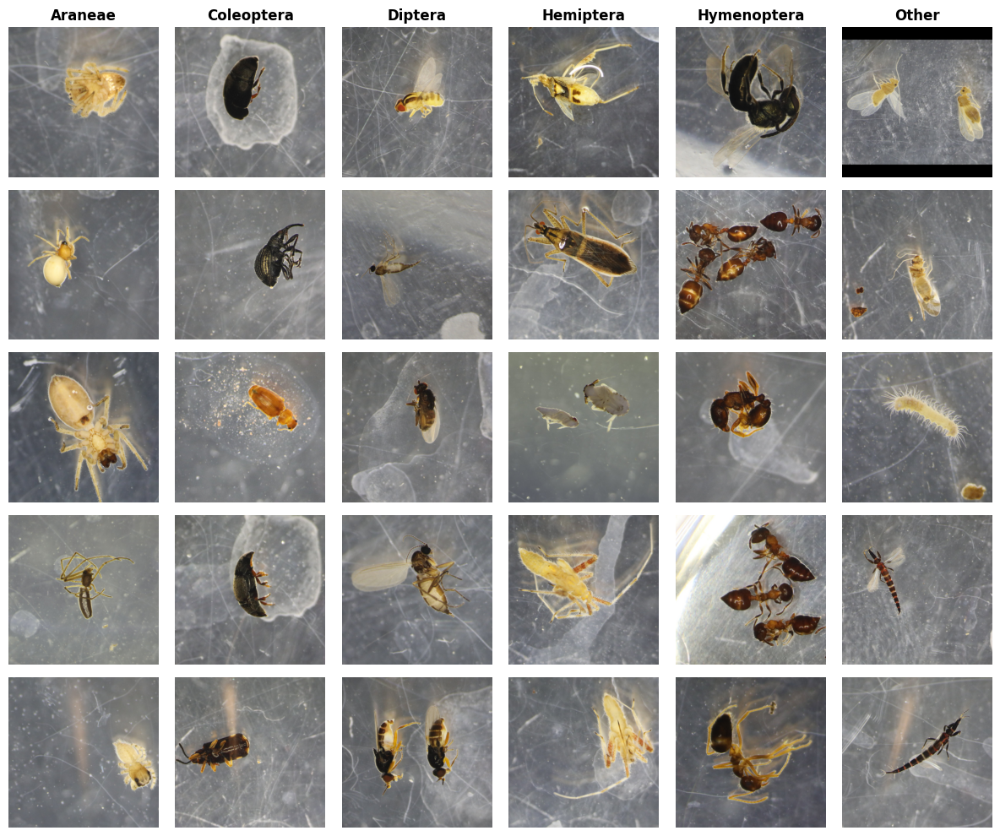

In [ ]:
show_sample_images(original_dir, 5)

# **3. Data Augmentations**

From the analysis above, we observed a significant class imbalance, with the Hemiptera class dominating the dataset (~44%). The remaining classes are underrepresented, making initial data augmentation essential for achieving balance.

Additionally, the dataset is relatively small (709 images in total), so further complex augmentations were applied to increase dataset variability and improve the model’s generalisation capability.

In [ ]:
from torchvision import transforms
from sklearn.model_selection import train_test_split
import shutil

## **3.1. Data Balancing**
To address class imbalance, we increased the number of samples in underrepresented classes to 312 using simple augmentations such as rotation and horizontal/vertical flipping. These transformations were chosen to introduce diversity while preserving the core features of each bug.

In [ ]:
balanced_dir = "/content/drive/MyDrive/MIE1517/0330 - Project Presentation/Balanced_Dataset"

In [ ]:
def data_balancing(input_dir, output_dir, target_count=312):
    os.makedirs(output_dir, exist_ok=True)

    # Define light augmentation: rotation + flipping
    basic_augment = transforms.Compose([
        transforms.RandomRotation(degrees=30),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomVerticalFlip(p=0.3),
    ])

    for class_name in sorted(os.listdir(input_dir)):
        src_folder = os.path.join(input_dir, class_name)
        if not os.path.isdir(src_folder):
            continue

        dst_folder = os.path.join(output_dir, class_name)
        os.makedirs(dst_folder, exist_ok=True)

        images = [f for f in os.listdir(src_folder) if f.lower().endswith((".jpg", ".jpeg"))]
        count = len(images)
        to_generate = target_count - count

        # Copy original images
        for img_name in images:
            img = Image.open(os.path.join(src_folder, img_name)).convert("RGB")
            img.save(os.path.join(dst_folder, img_name))

        # Generate augmented images
        for i in range(to_generate):
            img_name = images[i % count]
            img_path = os.path.join(src_folder, img_name)
            img = Image.open(img_path).convert("RGB")
            augmented = basic_augment(img)
            augmented.save(os.path.join(dst_folder, f"bal_{i}_{img_name}"))

    print("Dataset balanced and saved to:", output_dir)

In [ ]:
data_balancing(original_dir, balanced_dir, target_count=312)

KeyboardInterrupt: 

In [ ]:
def show_balanced_pairs(root_dir, n=3):
    """
    Displays, for each class that has at least one augmented image for balancing dataset,
    n randomly selected pairs (original and its augmented version).
    If a class has no augmented images (e.g. Hemiptera), that class is skipped.

    The grid will have one column per class (for classes with pairs) and n rows.
    """
    print(f"\033[1mDisplaying {n} augmented image pair(s) per class from: {root_dir}\033[0m\n")

    # Get list of classes (directories) in root_dir
    all_classes = sorted([d for d in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, d))])

    # Build dictionary mapping class -> list of pairs (original, augmented)
    class_pairs = {}
    for cls in all_classes:
        cls_path = os.path.join(root_dir, cls)
        files = [f for f in os.listdir(cls_path) if f.lower().endswith(('.jpg', '.jpeg'))]

        # Define augmented images as those whose filenames contain "aug" (case-insensitive)
        augmented = [f for f in files if "bal" in f.lower()]
        # Originals: files that do NOT contain "aug"
        originals = [f for f in files if "bal" not in f.lower()]

        pairs = []
        for orig in originals:
            orig_lower = orig.lower()
            possible_aug = [aug for aug in augmented if orig_lower in aug.lower()]
            if possible_aug:
                aug_choice = random.choice(possible_aug)
                pairs.append((os.path.join(cls_path, orig), os.path.join(cls_path, aug_choice)))
        if pairs:
            class_pairs[cls] = pairs
        else:
            print(f"No augmented pairs found in class {cls}; skipping it.")

    if not class_pairs:
        print("No classes with augmented pairs found. Please check your augmentation naming convention.")
        return

    # Determine number of columns from classes that have pairs
    class_names = sorted(class_pairs.keys())
    n_cols = len(class_names)

    # For each class, select up to n pairs
    for cls in class_names:
        pairs = class_pairs[cls]
        random.shuffle(pairs)
        class_pairs[cls] = pairs[:n]

    # Determine the number of rows to display (minimum pairs among selected classes)
    n_rows = min(len(pairs) for pairs in class_pairs.values())
    if n_rows == 0:
        print("No pairs found to display.")
        return

    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(4 * n_cols, 2 * n_rows))
    # Ensure axes is 2D array
    if n_rows == 1:
        axes = np.expand_dims(axes, axis=0)
    if n_cols == 1:
        axes = np.expand_dims(axes, axis=1)

    for col, cls in enumerate(class_names):
        pairs = class_pairs[cls]
        for row in range(n_rows):
            ax = axes[row][col]
            orig_path, aug_path = pairs[row]
            orig_img = Image.open(orig_path).convert("RGB").resize((224,224))
            aug_img = Image.open(aug_path).convert("RGB").resize((224,224))
            # Concatenate horizontally
            total_width = orig_img.width + aug_img.width
            combined = Image.new('RGB', (total_width, orig_img.height))
            combined.paste(orig_img, (0,0))
            combined.paste(aug_img, (orig_img.width,0))
            ax.imshow(combined)
            ax.axis("off")
            if row == 0:
                ax.set_title(cls, fontsize=12, fontweight='bold')

    plt.tight_layout()
    plt.show()

In [ ]:
dataset_summary(balanced_dir)

Dataset Summary: /content/drive/MyDrive/MIE1517/0330 - Project Presentation/Balanced_Dataset



,Araneae,Coleoptera,Diptera,Hemiptera,Hymenoptera,Other
Image Count,312,312,312,312,312,312
Percentage (%),16.67,16.67,16.67,16.67,16.67,16.67


Showing 5 image(s) per class: /content/drive/MyDrive/MIE1517/0330 - Project Presentation/Balanced_Dataset



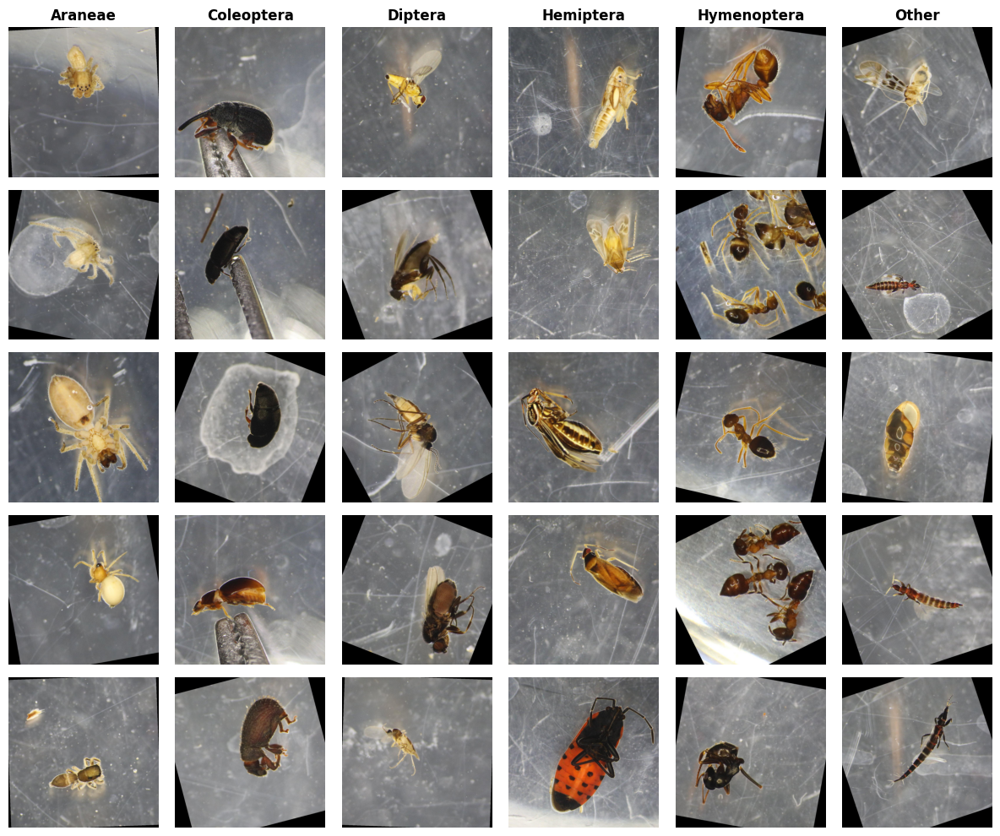

In [ ]:
show_sample_images(balanced_dir, 5)

Displaying 3 augmented image pair(s) per class from: /content/drive/MyDrive/MIE1517/0330 - Project Presentation/Balanced_Dataset

No augmented pairs found in class Hemiptera; skipping it.


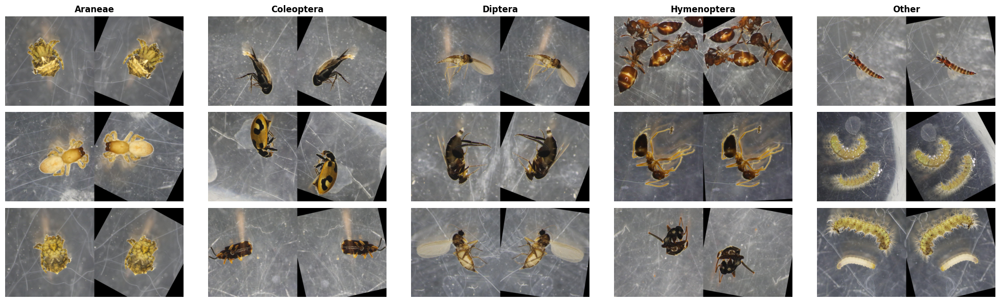

In [ ]:
show_balanced_pairs(balanced_dir, n=3)

## **3.2. Complex Augmentation**
Once the dataset was balanced, we applied more aggressive augmentations—such as color jitter, affine transformations, and Gaussian blur—to increase complexity and simulate real-world variability. This step helps improve the model’s robustness and generalization to unseen data.

In [ ]:
def data_augmentation(input_dir, output_dir, aug_per_image=2):
    """
    Applies advanced augmentation to each image in the input_dir (organized by class)
    and saves both the original image and aug_per_image augmented variants into output_dir.

    Parameters:
      input_dir (str): Path to the input directory (organized by class folders).
      output_dir (str): Path where the augmented dataset will be saved.
      aug_per_image (int): Number of augmented variants to generate per original image.
    """
    os.makedirs(output_dir, exist_ok=True)

    # Define advanced augmentation transformation
    advanced_transform = transforms.Compose([
        transforms.ColorJitter(brightness=0.2, contrast=0.2),
        transforms.RandomAffine(degrees=20, translate=(0.1, 0.1)),
        transforms.GaussianBlur(kernel_size=3, sigma=(0.1, 1.0)),
    ])

    # Process each class folder
    for class_name in os.listdir(input_dir):
        class_path = os.path.join(input_dir, class_name)
        if not os.path.isdir(class_path):
            continue

        # Create output folder for this class
        output_class_folder = os.path.join(output_dir, class_name)
        os.makedirs(output_class_folder, exist_ok=True)

        # List all images in the current class folder
        images = [f for f in os.listdir(class_path) if f.lower().endswith(('.jpg', '.jpeg'))]

        for img_name in images:
            img_path = os.path.join(class_path, img_name)
            try:
                img = Image.open(img_path).convert("RGB")
            except Exception as e:
                print(f"Error opening {img_path}: {e}")
                continue

            # Save original image to the output folder (without augmentation)
            img.save(os.path.join(output_class_folder, img_name))

            # Generate and save augmented variants (without resizing)
            for i in range(aug_per_image):
                aug_img = advanced_transform(img)
                new_name = f"aug_{i}_{img_name}"
                aug_img.save(os.path.join(output_class_folder, new_name))

    print("Data augmentation complete. Augmented data saved in:", output_dir)

In [ ]:
augmented_dir = "/content/drive/MyDrive/MIE1517/0330 - Project Presentation/Augmented_Dataset"

In [ ]:
data_augmentation(balanced_dir, augmented_dir, aug_per_image=2)

In [ ]:
def show_augmented_triplets(root_dir, n=3):
    """
    Displays n randomly selected triplets per class from the given directory.
    Each set is composed of: original image, two augmented images
    The function assumes that:
      - Each class folder contains original images (filenames that do NOT contain "aug_")
      - For each original image, there are augmented images whose filenames contain "aug_" and the original filename.
    The grid will have one column per class (for classes with triplets) and n rows.
    """
    print(f"\033[1mDisplaying {n} image set(s) per class from: {root_dir}\033[0m\n")

    all_classes = sorted([d for d in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, d))])

    # Build dictionary mapping each class to its list of triplets: (original, aug1, aug2)
    class_triplets = {}
    for cls in all_classes:
        cls_path = os.path.join(root_dir, cls)
        files = [f for f in os.listdir(cls_path) if f.lower().endswith(('.jpg', '.jpeg'))]

        # Originals: filenames that do NOT contain "aug_" (case-insensitive)
        originals = [f for f in files if "aug_" not in f.lower()]
        # Augmented: filenames that DO contain "bal_"
        augmented = [f for f in files if "aug_" in f.lower()]

        triplets = []
        for orig in originals:
            orig_lower = orig.lower()
            # Find all augmented images whose filename contains the original's filename
            possible_aug = [aug for aug in augmented if orig_lower in aug.lower()]
            if len(possible_aug) >= 2:
                # Randomly choose two distinct augmented images
                chosen_aug = random.sample(possible_aug, 2)
                triplets.append((os.path.join(cls_path, orig),
                                 os.path.join(cls_path, chosen_aug[0]),
                                 os.path.join(cls_path, chosen_aug[1])))
        if triplets:
            class_triplets[cls] = triplets
        else:
            print(f"No triplets found in class {cls}; skipping it.")

    if not class_triplets:
        print("No classes with image triplets found. Please check your augmentation naming convention.")
        return

    # Use only classes with triplets
    classes_with_triplets = sorted(class_triplets.keys())
    n_cols = len(classes_with_triplets)

    # For each class, randomly select up to n triplets
    for cls in classes_with_triplets:
        trips = class_triplets[cls]
        random.shuffle(trips)
        class_triplets[cls] = trips[:n]

    # Determine the number of rows to display (using the minimum count among classes)
    n_rows = min(len(trips) for trips in class_triplets.values())
    if n_rows == 0:
        print("No triplets found to display.")
        return

    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(6 * n_cols, 2 * n_rows))
    # Ensure axes is 2D even when n_rows or n_cols equals 1
    if n_rows == 1:
        axes = np.expand_dims(axes, axis=0)
    if n_cols == 1:
        axes = np.expand_dims(axes, axis=1)

    for col, cls in enumerate(classes_with_triplets):
        trips = class_triplets[cls]
        for row in range(n_rows):
            ax = axes[row][col]
            orig_path, aug1_path, aug2_path = trips[row]
            orig_img = Image.open(orig_path).convert("RGB").resize((224, 224))
            aug1_img = Image.open(aug1_path).convert("RGB").resize((224, 224))
            aug2_img = Image.open(aug2_path).convert("RGB").resize((224, 224))
            # Concatenate horizontally: original | aug1 | aug2
            total_width = orig_img.width + aug1_img.width + aug2_img.width
            combined = Image.new('RGB', (total_width, orig_img.height))
            combined.paste(orig_img, (0, 0))
            combined.paste(aug1_img, (orig_img.width, 0))
            combined.paste(aug2_img, (orig_img.width + aug1_img.width, 0))
            ax.imshow(combined)
            ax.axis("off")
            if row == 0:
                ax.set_title(cls, fontsize=12, fontweight='bold')

    plt.tight_layout()
    plt.show()

In [ ]:
dataset_summary(augmented_dir)

Dataset Summary: /content/drive/MyDrive/MIE1517/0330 - Project Presentation/Augmented_Dataset



,Araneae,Coleoptera,Diptera,Hemiptera,Hymenoptera,Other
Image Count,936,936,936,936,936,936
Percentage (%),16.67,16.67,16.67,16.67,16.67,16.67


Displaying 3 image set(s) per class from: /content/drive/MyDrive/MIE1517/0330 - Project Presentation/Augmented_Dataset



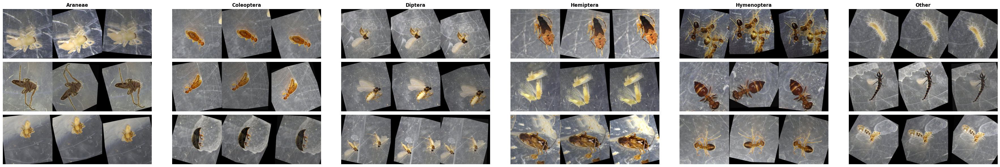

In [ ]:
show_augmented_triplets(augmented_dir)

# **4. Data Loading & Splitting for Classifiers**

With the dataset fully prepared and augmented, the next step is to load it into memory and split it for model training. We divide the data into three parts:

* Training Set (`train_loader`) – used to train the model
* Validation Set (`val_loader`) – used to tune hyperparameters and monitor for overfitting during training
*Test Set (`test_loader`) – used to evaluate the final performance of the trained model on unseen data

This split ensures that the model is trained and evaluated in a fair and systematic way. The data is loaded using PyTorch’s DataLoader for efficient batching, shuffling, and GPU-accelerated training.

For this project, we proposed and compared three models:
1. Transfer learning using EfficientNet as a feature extractor at layer B0
2. Transfer learning using AlexNet as a feature extractor
3. Self-defined convolutional neural network (CNN) model.

The feature extraction was done using pre-trained AlexNet and EfficientNet models, with the extracted features fed into our self-defined CNN models.

Specific settings for data loading and splitting were applied for different classifiers (see sections 4.1, 4.2, and 4.3 for details).

In [ ]:
import numpy as np
import time
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from torch.utils.data.sampler import SubsetRandomSampler
import os
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split, Subset, TensorDataset
import torchvision.models as models
from torchvision import models

from tqdm.auto import tqdm

In [ ]:
dataset_dir = "/content/drive/MyDrive/MIE1517/0330 - Project Presentation/Augmented_Dataset"

## **4.1. EfficientNetClassifier Settings**

In [ ]:
# efficient net
# Set torch seed for reproducbility

def set_seed(seed=42):
    torch.manual_seed(seed)
    np.random.seed(seed)

    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)  # For multi-GPU
        torch.backends.cudnn.deterministic = True  # Ensures deterministic behavior
        torch.backends.cudnn.benchmark = False  # May slow down training but makes it deterministic

# Call this function at the beginning of training
set_seed(42)  # Set any fixed number

In [ ]:
def efficient_net_data_loader(dataset_path, batch_size=256, efficient_net_model="b0", seed=42, log=False):
    # Set random seed for reproducibility
    torch.manual_seed(seed)

    # Adjust input size based on EfficientNet variant
    input_size = {
        "b0": 224, "b1": 240, "b2": 260, "b3": 300, "b4": 380,
        "b5": 456, "b6": 528, "b7": 600
    }

    # Define EfficientNet-compatible transformations
    transform = transforms.Compose([
        transforms.Resize((input_size[efficient_net_model], input_size[efficient_net_model])),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # ImageNet normalization
    ])

    # Load dataset using ImageFolder
    dataset = datasets.ImageFolder(root=dataset_path, transform=transform)
    classes = dataset.classes

    # Set fixed seed for consistent dataset split
    torch.manual_seed(seed)

    # Split the dataset into train (70%), val (15%), and test (15%)
    train_size = int(0.7 * len(dataset))
    val_size = int(0.15 * len(dataset))
    test_size = len(dataset) - train_size - val_size
    train_data, val_data, test_data = random_split(dataset, [train_size, val_size, test_size])

    # Create DataLoaders
    train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True, pin_memory=True, num_workers=2)
    val_loader = DataLoader(val_data, batch_size=batch_size, shuffle=False, pin_memory=True, num_workers=2)
    test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False, pin_memory=True, num_workers=2)  # No shuffling for test set

    if log:
      # Print class labels and dataset details
      print("Dataset loaded successfully!")
      print("Classes detected:", dataset.classes)
      print("Number of images:", len(dataset))
      print("Image Shape:", dataset[0][0].shape)

    return train_loader, val_loader, test_loader, classes

In [ ]:
# Load dataset for EfficientNet
train_loader, val_loader, test_loader, classes = efficient_net_data_loader(dataset_dir, batch_size=32, efficient_net_model="b0", seed=42, log=True)


Dataset loaded successfully!
Classes detected: ['Araneae', 'Coleoptera', 'Diptera', 'Hemiptera', 'Hymenoptera', 'Other']
Number of images: 5616
Image Shape: torch.Size([3, 224, 224])


In [ ]:
# # Get the efficient net pre-trained features

weight = models.EfficientNet_B0_Weights.DEFAULT

model = models.efficientnet_b0(weights=weight)

# Feature extractor
feature_extractor = nn.Sequential(*list(model.children())[:-1])

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 130MB/s]


In [ ]:
# Get extracted features
def efficient_net_features_data_loader(model, dataloader, batch_size):
  device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
  if device == torch.device("cuda"):
    print("Using GPU ...")
  model.to(device)
  model.eval()

  with torch.no_grad():
    features, labels = [], []
    for imgs, lbls in tqdm(dataloader, total=len(dataloader)):
      imgs, lbls = imgs.to(device), lbls.to(device)
      feats = model(imgs)
      features.append(feats.cpu())
      labels.append(lbls.cpu())

    features = torch.cat(features, dim=0)
    labels = torch.cat(labels, dim=0)

    dataset = TensorDataset(features, labels)
    dataloader = DataLoader(dataset, batch_size = batch_size, shuffle=False)

  return dataloader

In [ ]:
efficient_train_loader = efficient_net_features_data_loader(feature_extractor, train_loader, 32)
efficient_val_loader = efficient_net_features_data_loader(feature_extractor, val_loader, 32)
efficient_test_loader = efficient_net_features_data_loader(feature_extractor, test_loader, 32)

Using GPU ...


  0%|          | 0/123 [00:00<?, ?it/s]

Using GPU ...


  0%|          | 0/27 [00:00<?, ?it/s]

Using GPU ...


  0%|          | 0/27 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e6d482d0860>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1601, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.11/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e6d482d0860>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 16

## **4.2. AlexNetClassifier Settings**

In [ ]:
def data_preprocessing_alexnet(dataset_path, batch_size=32):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Define transformations for AlexNet
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize((0.5,), (0.5,))
    ])

    dataset = datasets.ImageFolder(root=dataset_path, transform=transform)
    classes = dataset.classes

    train_size = int(0.7 * len(dataset))
    val_size = int(0.15 * len(dataset))
    test_size = len(dataset) - train_size - val_size
    train_data, val_data, test_data = random_split(dataset, [train_size, val_size, test_size])

    alexnet = models.alexnet(pretrained=True).to(device)
    alexnet.eval()  # Set model to evaluation mode
    feature_extractor = alexnet.features  # Extract convolutional layers

    def extract_features(data_subset):
        features_list = []
        labels_list = []

        data_loader = DataLoader(data_subset, batch_size=batch_size, shuffle=False)
        with torch.no_grad():
            for imgs, labels in data_loader:
                imgs = imgs.to(device)
                features = feature_extractor(imgs)
                features = features.view(features.size(0), -1)
                features_list.append(features.cpu())
                labels_list.append(labels.cpu())

        return TensorDataset(torch.cat(features_list), torch.cat(labels_list))

    # Convert datasets to feature-based datasets
    print("Loading Training...")
    train_dataset = extract_features(train_data)
    print("Loading Validation...")
    val_dataset = extract_features(val_data)
    print("Loading Test...")
    test_dataset = extract_features(test_data)

    # Create DataLoaders
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    print("AlexNet features loaded successfully!")
    print("Classes detected:", classes)
    print("Number of images:", len(dataset))
    print("Image Shape:", dataset[0][0].shape)

    return train_loader, val_loader, test_loader, classes


In [ ]:
# Load AlexNet features
train_loader, val_loader, test_loader, classes = data_preprocessing_alexnet(dataset_dir, batch_size=32)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:01<00:00, 153MB/s]


Loading Training...
Loading Validation...


KeyboardInterrupt: 

## **4.3 CNNClassifier Settings**

In [ ]:
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader

def image_data_loaders(dataset_path, batch_size=32):
    # image transformations
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor()
    ])

    dataset = datasets.ImageFolder(root=dataset_path, transform=transform)
    classes = dataset.classes

    train_size = int(0.7 * len(dataset))
    val_size = int(0.15 * len(dataset))
    test_size = len(dataset) - train_size - val_size
    train_data, val_data, test_data = random_split(dataset, [train_size, val_size, test_size])



    train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_data, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(val_data, batch_size=batch_size, shuffle=False)

    return train_loader, val_loader, test_loader

In [ ]:
# Load images for autoencoder model
train_loader, val_loader, test_loader = image_data_loaders(dataset_dir, batch_size=256)


# **5. Classifier Implementation**

This section shows the architecture of each classifier.

## **5.1. EfficientNetClassifier**
**Architecture:** EfficientNet B0 with pre-trained weights used for feature extraction.

In [ ]:
class EfficientNetClassifier(nn.Module):
    def __init__(self, num_classes):
        super(EfficientNetClassifier, self).__init__()
        self.fc1 = nn.Linear(1280, 512)
        self.fc2 = nn.Linear(512, 128)
        self.fc3 = nn.Linear(128, num_classes)
        self.dropout = nn.Dropout(0.5)

    def forward(self, x):
        x = x.view(x.size(0), -1)  # Flatten the data input
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = F.relu(self.fc2(x))
        x = self.dropout(x)
        x = self.fc3(x)
        return x

In [ ]:
imgs, lbls = next(iter(efficient_train_loader))

model = EfficientNetClassifier(num_classes=len(classes))
model(imgs).shape

torch.Size([32, 6])

## **5.2. AlexNetClassifier**
**Architecture:** AlexNet with pre-trained weights for transfer learning.

In [ ]:
class AlexNetClassifier(nn.Module):
    def __init__(self, num_classes):
        super(AlexNetClassifier, self).__init__()
        self.fc = nn.Sequential(
            nn.Linear(9216, 512),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        return self.fc(x)

## **5.3. CNNClassifier**
**Architecture:** A custom CNN designed with multiple convolutional and fully connected layers.

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim

class CNNClassifier(nn.Module):
    def __init__(self, num_classes=5):
        super(CNNClassifier, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.ReLU()
        )

        dummy_input = torch.zeros(1, 3, 224, 224)
        with torch.no_grad():
            self.feature_map_size = self.encoder(dummy_input).view(1, -1).shape[1]

        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(self.feature_map_size, 512)
        self.fc2 = nn.Linear(512, num_classes)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.5)

    def forward(self, x):
        encoded = self.encoder(x)
        flattened = self.flatten(encoded)
        logits = self.fc2(self.dropout(self.relu(self.fc1(flattened))))
        return logits

# **6. Classifier Training**

This section outlines the training pipeline for each classifier.

## **6.1. EfficientNetClassifier**

In [ ]:
# Evaluate the loss and accuracy
import matplotlib.pyplot as plt
def evaluate_model_enc(model, criterion, data_loader):
  device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
  total_loss = 0.0
  total_err = 0.0
  total_samples = 0

  model.eval()
  model.to(device)
  with torch.no_grad():
    for imgs, labels in data_loader:
      imgs, labels = imgs.to(device), labels.to(device)

      output = model(imgs)
      loss = criterion(output, labels)
      _, predicted = torch.max(output, dim=1)
      total_samples += labels.shape[0]
      total_err += int((predicted != labels).sum())
      total_loss += loss.item()
  err = total_err/total_samples
  acc = 1-err
  loss = total_loss/total_samples
  return acc, loss

def plot_training_curves_enc(train_losses, val_losses, train_accs, val_accs):
    plt.figure()
    plt.title("Train vs Validation Loss")
    plt.plot(train_losses, label="Train Loss")
    plt.plot(val_losses, label="Validation Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

    plt.figure()
    plt.title("Train vs Validation Accuracy")
    plt.plot(train_accs, label="Train Accuracy")
    plt.plot(val_accs, label="Validation Accuracy")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.show()

In [ ]:
def train_model_enc(model, train_loader, val_loader, epochs=10, lr=0.001, device='cuda'):
    device = torch.device(device if torch.cuda.is_available() else "cpu")
    model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=1e-4)

    train_losses, val_losses, train_accs, val_accs = [], [], [], []

    for epoch in range(epochs):
        model.train()
        running_loss, correct, total = 0.0, 0, 0

        for features, labels in train_loader:
            features, labels = features.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(features)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * features.size(0)
            correct += (outputs.argmax(dim=1) == labels).sum().item()
            total += labels.size(0)

        train_loss = running_loss / total
        train_acc = correct / total
        val_acc, val_loss = evaluate_model_enc(model, criterion, val_loader)

        train_losses.append(train_loss)
        val_losses.append(val_loss)
        train_accs.append(train_acc)
        val_accs.append(val_acc)

        print(f"Epoch {epoch+1}/{epochs} - Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f} | Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

    plot_training_curves_enc(train_losses, val_losses, train_accs, val_accs)
    return model

Epoch 1/10 - Train Loss: 0.6330, Train Acc: 0.7794 | Val Loss: 0.0052, Val Acc: 0.9501
Epoch 2/10 - Train Loss: 0.1396, Train Acc: 0.9562 | Val Loss: 0.0032, Val Acc: 0.9751
Epoch 3/10 - Train Loss: 0.0740, Train Acc: 0.9774 | Val Loss: 0.0013, Val Acc: 0.9881
Epoch 4/10 - Train Loss: 0.0553, Train Acc: 0.9835 | Val Loss: 0.0007, Val Acc: 0.9929
Epoch 5/10 - Train Loss: 0.0287, Train Acc: 0.9914 | Val Loss: 0.0008, Val Acc: 0.9917
Epoch 6/10 - Train Loss: 0.0335, Train Acc: 0.9908 | Val Loss: 0.0014, Val Acc: 0.9869
Epoch 7/10 - Train Loss: 0.0261, Train Acc: 0.9921 | Val Loss: 0.0006, Val Acc: 0.9929
Epoch 8/10 - Train Loss: 0.0302, Train Acc: 0.9891 | Val Loss: 0.0007, Val Acc: 0.9929
Epoch 9/10 - Train Loss: 0.0155, Train Acc: 0.9959 | Val Loss: 0.0007, Val Acc: 0.9929
Epoch 10/10 - Train Loss: 0.0183, Train Acc: 0.9949 | Val Loss: 0.0012, Val Acc: 0.9893


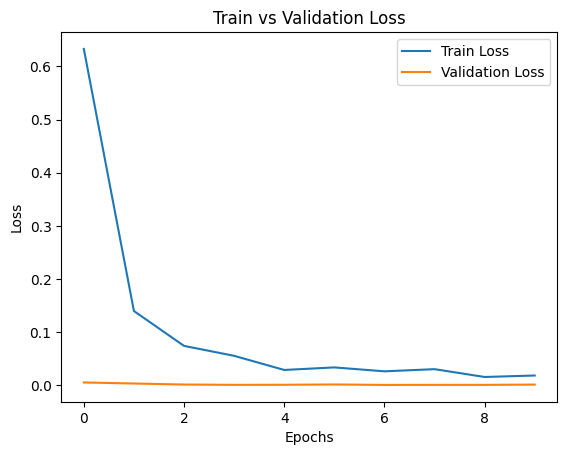

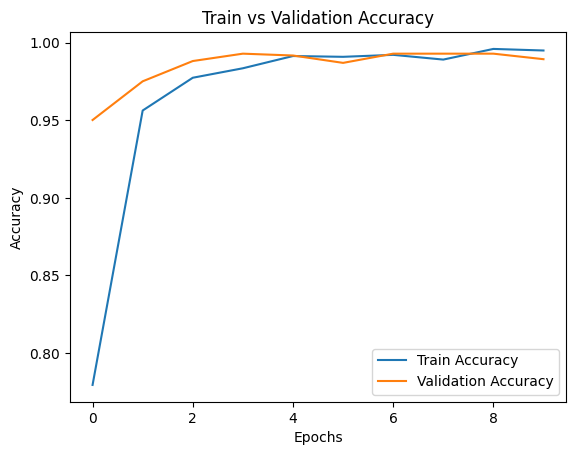

In [ ]:
num_classes = len(classes)
model = EfficientNetClassifier(num_classes=num_classes)
trained_model_enc = train_model_enc(model, efficient_train_loader, efficient_val_loader, epochs=10, lr=0.001, device='cuda')

In [ ]:
# Saved the current weight
efficient_weight_path = "/content/drive/MyDrive/MIE1517/0330 - Project Presentation/Efficientnet_weights/weights.pth"
torch.save(trained_model_enc.state_dict(), efficient_weight_path)

## **6.2. AlexNetClassifier**

In [ ]:
def train_model(model, train_loader, val_loader, epochs=10, lr=0.001, device='cuda'):
    device = torch.device(device if torch.cuda.is_available() else "cpu")
    model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=1e-2)

    train_losses, val_losses, train_accs, val_accs = [], [], [], []

    for epoch in range(epochs):
        model.train()
        running_loss, correct, total = 0.0, 0, 0

        for features, labels in train_loader:
            features, labels = features.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(features)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * features.size(0)
            correct += (outputs.argmax(dim=1) == labels).sum().item()
            total += labels.size(0)

        train_loss = running_loss / total
        train_acc = correct / total
        val_loss, val_acc = evaluate_model(model, val_loader, criterion, device)

        train_losses.append(train_loss)
        val_losses.append(val_loss)
        train_accs.append(train_acc)
        val_accs.append(val_acc)

        print(f"Epoch {epoch+1}/{epochs} - Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f} | Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

    plot_training_curves(train_losses, val_losses, train_accs, val_accs)
    return model

def evaluate_model(model, loader, criterion, device):
    model.eval()
    running_loss, correct, total = 0.0, 0, 0
    with torch.no_grad():
        for features, labels in loader:
            features, labels = features.to(device), labels.to(device)
            outputs = model(features)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * features.size(0)
            correct += (outputs.argmax(dim=1) == labels).sum().item()
            total += labels.size(0)
    return running_loss / total, correct / total

def plot_training_curves(train_losses, val_losses, train_accs, val_accs):
    plt.figure()
    plt.title("Train vs Validation Loss")
    plt.plot(train_losses, label="Train Loss")
    plt.plot(val_losses, label="Validation Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

    plt.figure()
    plt.title("Train vs Validation Accuracy")
    plt.plot(train_accs, label="Train Accuracy")
    plt.plot(val_accs, label="Validation Accuracy")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.show()

Epoch 1/40 - Train Loss: 1.5799, Train Acc: 0.4012 | Val Loss: 1.3083, Val Acc: 0.6734
Epoch 2/40 - Train Loss: 1.1517, Train Acc: 0.6556 | Val Loss: 1.0122, Val Acc: 0.7423
Epoch 3/40 - Train Loss: 0.9071, Train Acc: 0.7316 | Val Loss: 0.8437, Val Acc: 0.7791
Epoch 4/40 - Train Loss: 0.7484, Train Acc: 0.7988 | Val Loss: 0.7274, Val Acc: 0.8052
Epoch 5/40 - Train Loss: 0.6449, Train Acc: 0.8199 | Val Loss: 0.6531, Val Acc: 0.8278
Epoch 6/40 - Train Loss: 0.5569, Train Acc: 0.8481 | Val Loss: 0.5906, Val Acc: 0.8456
Epoch 7/40 - Train Loss: 0.4960, Train Acc: 0.8761 | Val Loss: 0.5434, Val Acc: 0.8563
Epoch 8/40 - Train Loss: 0.4375, Train Acc: 0.9008 | Val Loss: 0.5042, Val Acc: 0.8575
Epoch 9/40 - Train Loss: 0.3982, Train Acc: 0.9112 | Val Loss: 0.4627, Val Acc: 0.8717
Epoch 10/40 - Train Loss: 0.3473, Train Acc: 0.9283 | Val Loss: 0.4324, Val Acc: 0.8848
Epoch 11/40 - Train Loss: 0.3239, Train Acc: 0.9334 | Val Loss: 0.4106, Val Acc: 0.8884
Epoch 12/40 - Train Loss: 0.2972, Train A

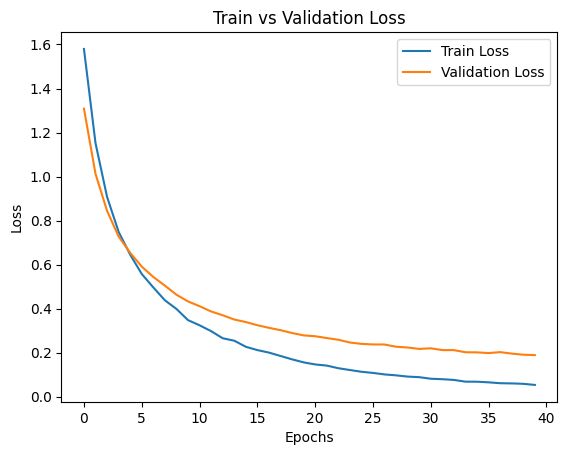

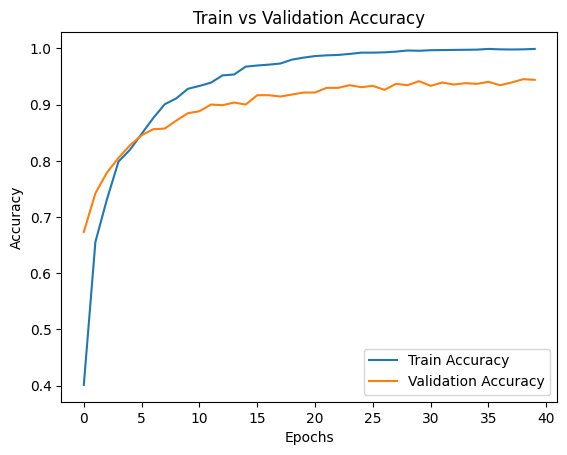

In [ ]:
num_classes = 6
model = AlexNetClassifier(num_classes)
trained_model = train_model(model, train_loader, val_loader, epochs=40, lr=1e-5)

## **6.3. CNNClassifier**

In [ ]:
def train_model(model, train_loader, val_loader, epochs=10, lr=0.001, device='cuda'):
    device = torch.device(device if torch.cuda.is_available() else "cpu")
    model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=1e-2)

    train_losses, val_losses, train_accs, val_accs = [], [], [], []

    for epoch in range(epochs):
        model.train()
        running_loss, correct, total = 0.0, 0, 0

        for features, labels in train_loader:
            features, labels = features.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(features)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * features.size(0)
            correct += (outputs.argmax(dim=1) == labels).sum().item()
            total += labels.size(0)

        train_loss = running_loss / total
        train_acc = correct / total
        val_loss, val_acc = evaluate_model(model, val_loader, criterion, device)

        train_losses.append(train_loss)
        val_losses.append(val_loss)
        train_accs.append(train_acc)
        val_accs.append(val_acc)

        print(f"Epoch {epoch+1}/{epochs} - Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f} | Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

    plot_training_curves(train_losses, val_losses, train_accs, val_accs)
    return model

def evaluate_model(model, loader, criterion, device):
    model.eval()
    running_loss, correct, total = 0.0, 0, 0
    with torch.no_grad():
        for features, labels in loader:
            features, labels = features.to(device), labels.to(device)
            outputs = model(features)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * features.size(0)
            correct += (outputs.argmax(dim=1) == labels).sum().item()
            total += labels.size(0)
    return running_loss / total, correct / total

def plot_training_curves(train_losses, val_losses, train_accs, val_accs):
    plt.figure()
    plt.title("Train vs Validation Loss")
    plt.plot(train_losses, label="Train Loss")
    plt.plot(val_losses, label="Validation Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

    plt.figure()
    plt.title("Train vs Validation Accuracy")
    plt.plot(train_accs, label="Train Accuracy")
    plt.plot(val_accs, label="Validation Accuracy")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.show()

Epoch 1/40 - Train Loss: 2.0884, Train Acc: 0.1788 | Val Loss: 1.7868, Val Acc: 0.1865
Epoch 2/40 - Train Loss: 1.7612, Train Acc: 0.2195 | Val Loss: 1.6629, Val Acc: 0.3040
Epoch 3/40 - Train Loss: 1.6333, Train Acc: 0.3182 | Val Loss: 1.5979, Val Acc: 0.3575
Epoch 4/40 - Train Loss: 1.5380, Train Acc: 0.3633 | Val Loss: 1.4969, Val Acc: 0.3670
Epoch 5/40 - Train Loss: 1.4665, Train Acc: 0.4068 | Val Loss: 1.4402, Val Acc: 0.3990
Epoch 6/40 - Train Loss: 1.4264, Train Acc: 0.4281 | Val Loss: 1.3852, Val Acc: 0.4240
Epoch 7/40 - Train Loss: 1.3748, Train Acc: 0.4414 | Val Loss: 1.3693, Val Acc: 0.4394
Epoch 8/40 - Train Loss: 1.3190, Train Acc: 0.4729 | Val Loss: 1.3456, Val Acc: 0.4644
Epoch 9/40 - Train Loss: 1.2866, Train Acc: 0.4808 | Val Loss: 1.3134, Val Acc: 0.4786
Epoch 10/40 - Train Loss: 1.2288, Train Acc: 0.5108 | Val Loss: 1.2895, Val Acc: 0.4584
Epoch 11/40 - Train Loss: 1.2034, Train Acc: 0.5230 | Val Loss: 1.2609, Val Acc: 0.4751
Epoch 12/40 - Train Loss: 1.1652, Train A

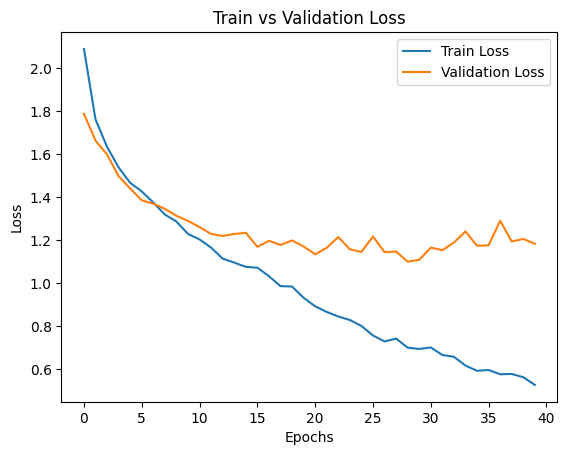

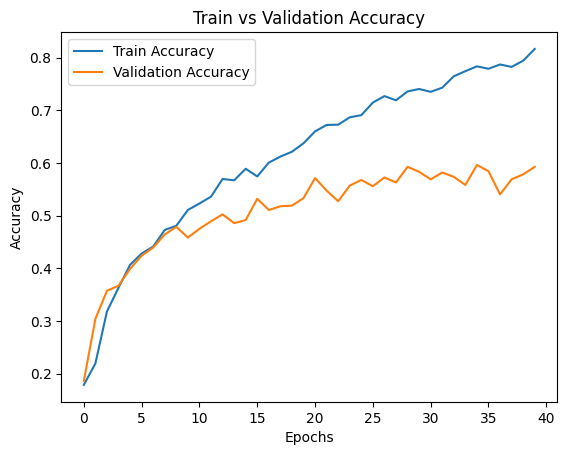

In [ ]:
num_classes = 6
model = CNNClassifier(num_classes)
trained_model = train_model(model, train_loader, val_loader, epochs=40, lr=1e-3)


From the three sets of training curves, we found that transfer learning with EfficientNet B0 performed the best. EfficientNet is designed with compound scaling, meaning it balances depth, width, and resolution, leading to more efficient feature representations compared to older architectures like AlexNet or ResNet-18. Inspired by MobileNetV2, EfficientNet also employs inverted residual blocks to further optimize resource usage. These blocks start with a lightweight depth-wise convolution followed by point-wise expansion and another depth-wise convolution. Additionally, squeeze-and-excitation operations are incorporated to enhance feature representation by recalibrating channel-wise responses. These characteristics of EfficientNet allowed it perform better than AlexNet.

Furthermore, our self-defined CNN model performed the worst, which is expected given its limited training. Unlike the pre-trained models, which have already been trained on large-scale datasets like ImageNet, our model likely requires more data and extended training to achieve comparable performance.


# **7. Classifier Testing**

This section presents the results from testing each classifier.

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns

def get_accuracy(loader, model, device):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)
    return correct / total

def get_preds(model, loader, device):
    model.eval()
    preds = []
    labels = []
    with torch.no_grad():
        for images, label in loader:
            images, label = images.to(device), label.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            preds.extend(predicted.cpu().numpy())
            labels.extend(label.cpu().numpy())
    return np.array(preds), np.array(labels)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## **7.1. EfficientNetClassifier**

Test Accuracy: 0.9917


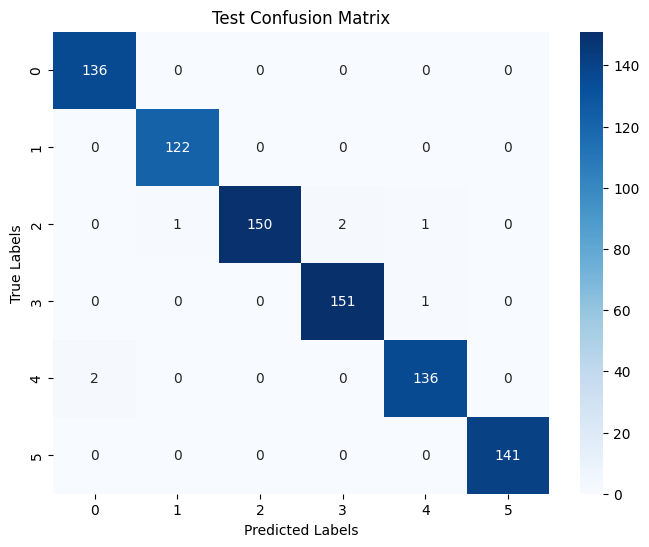

In [ ]:
test_acc_efficient = get_accuracy(efficient_test_loader, trained_model_enc, device)


y_pred, y_true = get_preds(trained_model_enc, efficient_test_loader, device)
print(f"Test Accuracy: {test_acc_efficient:.4f}")

conf_matrix = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=range(num_classes), yticklabels=range(num_classes))
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Test Confusion Matrix")
plt.show()

## **7.2. AlexNet Classifier**

Test Accuracy: 0.9502


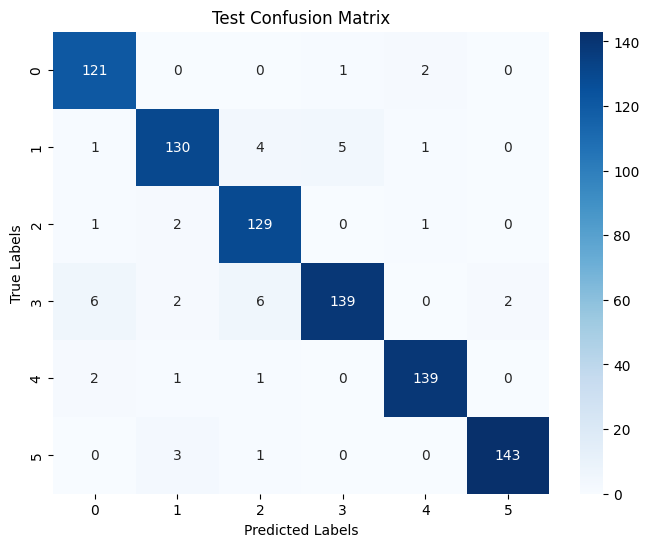

In [ ]:
test_acc_alexnet = get_accuracy(test_loader, model, device)



y_pred, y_true = get_preds(model, test_loader, device)
print(f"Test Accuracy: {test_acc_alexnet:.4f}")

conf_matrix = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=range(num_classes), yticklabels=range(num_classes))
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Test Confusion Matrix")
plt.show()

## **7.3. CNNClassifier**

Test Accuracy: 0.5926


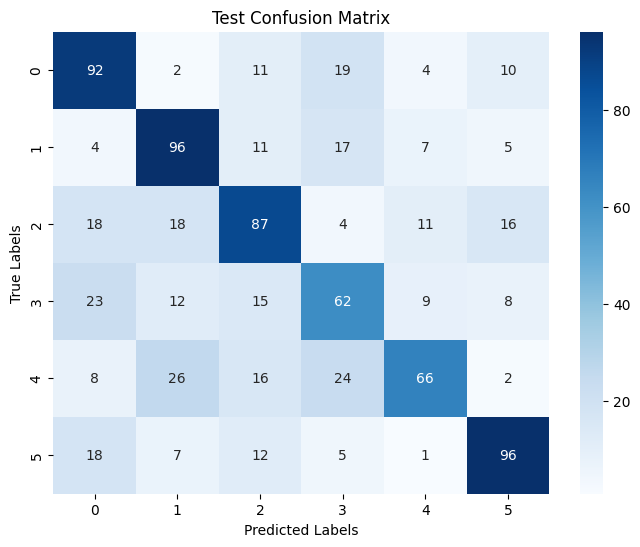

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
test_acc_sdm = get_accuracy(test_loader, model, device)



y_pred, y_true = get_preds(model, test_loader, device)
print(f"Test Accuracy: {test_acc_sdm:.4f}")

conf_matrix = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=range(num_classes), yticklabels=range(num_classes))
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Test Confusion Matrix")
plt.show()

## **7.4. Testing Summary**

The evaluation results on the test dataset align closely with the training and validation performances. The transfer learning approach using EfficientNet B0 achieved the highest test accuracy. An analysis of the test dataset's confusion matrix confirms that this model performs consistently well across all classes, with minimal misclassifications. A more detailed comparison of the performance of the three models can be found in Section 8.

# **8. Classifier Performance Discussion**

This section summarizes the performance of the three classifiers tested in our study: EfficientNet, AlexNet, and the custom CNN.

### **8.1. EfficientNetClassifier Performance**

The results demonstrate that the EfficientNet model performs exceptionally well on this insect classification task:

### 📉 **Loss Analysis**
- Training Loss: Decreased rapidly, reaching very low values by epoch 5 and stabilizing thereafter.
- Validation Loss: Decreased significantly and remained near zero across all epochs.
- Conclusion: No indication of overfitting, which suggests good generalization.

### 📈 **Accuracy Analysis**
- Training Accuracy: Reached 99.59% by epoch 9.
- Validation Accuracy: Reached 99.29% by epoch 4 and stayed stable.
- Test Accuracy: 99.17%

### 💠 **Confusion Matrix Analysis:**
- The classifier performed exceptionally well in most classes, achieving high precision across all categories, indicating that class imbalance was effectively addressed through data augmentation.
- Minimal misclassification was observed (in Diptera and Hepiptera).

### ✅ **Overall Assessment**
- The EfficientNet model performed exceptionally well, achieving both high accuracy and stability.
- The model demonstrated strong generalization ability with no signs of overfitting.
- The data augmentation strategies, including balancing and complex transformations, likely contributed to the model's robustness.

### **8.2. AlexNetClassifier Performance**

The AlexNet model performed well but showed some limitations compared to EfficientNet.

### 📉 **Loss Analysis**
- **Training Loss:** Decreased steadily over the epochs, approaching zero by epoch 40.
- **Validation Loss:** Decreased consistently but started to plateau around epoch 30.
- **Conclusion:** The model demonstrated good learning behavior but showed signs of overfitting, as indicated by the widening gap between training and validation loss.

### 📈 **Accuracy Analysis**
- **Training Accuracy:** Peaked at 99.92%.
- **Validation Accuracy:** Reached 94.54% by epoch 39.
- **Test Accuracy:** 95.02%

### 💠 **Confusion Matrix Analysis:**
- The model showed good performance overall, with particularly high accuracy for Araneae, Diptera, Hymenoptera, and Other.
- Misclassifications occurred mostly between visually similar classes, such as Diptera and Coleoptera.
- Some confusion was observed in predicting Coleoptera and Hemiptera classes labels, which could be due to the inherent visual diversity within this class.

### ✅ **Overall Assessment**
- The AlexNet model demonstrated strong performance with high accuracy and stable loss across 40 epochs.
- However, the model exhibited some overfitting, which is expected given the relatively small dataset and the complexity of AlexNet.
- Despite mild overfitting, AlexNet remains a powerful model, albeit less robust compared to EfficientNet.

### **8.3. CNNClassifier Performance**

The custom CNN model showed limited performance, especially when compared to pre-trained models like EfficientNet and AlexNet.

### 📉 **Loss Analysis**
- **Training Loss:** Decreased steadily throughout 40 epochs, but at a slower pace.
- **Validation Loss:** Plateaued early and showed fluctuations from epoch 10 onward.
- **Conclusion:** The model struggled with generalization, as indicated by early stagnation in validation loss and subsequent fluctuations.

### 📈 **Accuracy Analysis**
- **Training Accuracy:** Reached 81.63% by epoch 40.
- **Validation Accuracy:** Peaked at 59.26% and then stagnated.
- **Test Accuracy:** 59.26%

### 💠 **Confusion Matrix Analysis:**
- The model struggled with most classes, with noticeable misclassification across all categories.
- The Hemiptera and Hymenoptera classes had the most significant misclassifications, possibly due to insufficient feature extraction capability from the custom CNN architecture.
- The performance was weak, particularly in distinguishing visually similar bugs, showing the need for a more powerful model or better feature extraction techniques.

### ✅ **Overall Assessment**
- The custom CNN model lacked the feature extraction power seen in transfer learning models like EfficientNet and AlexNet.
- The model showed weak generalization, with overfitting being evident due to its inability to learn from the validation set effectively.
- While suitable for experimentation, the custom CNN is not competitive for real-world bug classification tasks without substantial improvements.

## **8.4. Performance Summary**

After evaluating all three classifiers, we conclude that:

- **EfficientNet** provides the best performance overall due to its:
  - Higher classification accuracy
  - Lower training and validation loss
  - Minimal overfitting
  - Computational efficiency

Next, we proceed by integrating the EfficientNet model with an object detection pipeline using DINOv2 to further enhance our bug classification system.

#  **9. Moel Integration: DINO AI (Object Detection) + EfficientNet Classifier**

In this section, we implemented object detection wth DINOv2, a self-supervised visual transformer capable of discovering and segmenting objects without manual labeling.

In [ ]:
# Transformers (for DINO Vision Transformer)
from transformers import AutoImageProcessor, Dinov2Model
import cv2

## **9.1. Load EfficientNet Classifier Weights**

In [ ]:
# Get the efficient net pre-trained features

weight = models.EfficientNet_B0_Weights.DEFAULT

model = models.efficientnet_b0(weights=weight)

# Feature extractor
feature_extractor = nn.Sequential(*list(model.children())[:-1])

# Load the state dict
efficient_classify = EfficientNetClassifier(num_classes=len(classes))
efficient_classify.load_state_dict(torch.load("/content/drive/MyDrive/MIE1517/0330 - Project Presentation/Efficientnet_weights/weights.pth"))
efficient_classify.eval()

EfficientNetClassifier(
  (fc1): Linear(in_features=1280, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=128, bias=True)
  (fc3): Linear(in_features=128, out_features=6, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

## **9.2. Load Unseen Multiple Bugs Data**

In [ ]:
image_dir = "/content/drive/MyDrive/MIE1517/0330 - Project Presentation/mixed_bugs_unlabled"

transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
    ])

# List all image files in the directory
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]
image_files.sort()  # Sort files for consistency
print(f"Found {len(image_files)} images: {image_files}")

images = []
image_paths = []

for image_file in image_files:
    image_path = os.path.join(image_dir, image_file)
    try:
        # Load the image
        image = Image.open(image_path).convert("RGB")  # Ensure RGB format
        # Apply transformations
        image_tensor = transform(image)  # Shape: [3, 224, 224]
        images.append(image_tensor)
        image_paths.append(image_path)
        # print(f"Processed {image_file}")
    except Exception as e:
        print(f"Error processing {image_file}: {e}")

# Stack all images into a single tensor
images_tensor = torch.stack(images)  # Shape: [num_images, 3, 224, 224]
print(f"Images tensor shape: {images_tensor.shape}")

# Option 1: Save as a PyTorch tensor file (.pt)
torch.save({
    "images": images_tensor,
    "image_paths": image_paths
}, "bugs_images_v3_preprocessed.pt")
print("Saved preprocessed images to 'bugs_images_v3_preprocessed.pt'")

Found 139 images: ['10, 2, 1 IMG_0011.jpg', '10, 2, 1 IMG_0012.jpg', '10, 2, 3 IMG_0023.jpg', '10, 2, 3 IMG_0026.jpg', '10, 2, 3 IMG_0027.jpg', '10, 2, 4 IMG_0040.jpg', '10, 2, 4 IMG_0041.jpg', '11, 1, 3 IMG_0018.jpg', '11, 1, 3 IMG_0019.jpg', '11, 2, 1 IMG_0035.jpg', '11, 2, 3 IMG_0069.jpg', '11, 2, 3 IMG_0070.jpg', '12, 2, 3 IMG_0061.jpg', '12, 2, 3 IMG_0062.jpg', '13, 0.5, 2 IMG_0025.jpg', '13, 0.5, 3 IMG_0001.jpg', '13, 0.5, 3 IMG_0002.jpg', '13, 0.5, 7 IMG_0011.jpg', '13, 0.5, 7 IMG_0012.jpg', '13, 1, 7 IMG_0033.jpg', '13, 1, 7 IMG_0034.jpg', '13, 1, 7 IMG_0035.jpg', '14, 2, 1 IMG_0011.jpg', '14, 2, 2 IMG_0032.jpg', '14, 2, 2 IMG_0033.jpg', '14, 2, 2 IMG_0034.jpg', '14, 2, 2 IMG_0035.jpg', '14, 2, 2 IMG_0036.jpg', '14, 2, 2 IMG_0037.jpg', '14, 2, 3 IMG_0001.jpg', '14, 2, 3 IMG_0002.jpg', '4, 1, 7 IMG_0099.jpg', '4, 1, 7 IMG_0100.jpg', '4, 2, 2 IMG_0017.jpg', '4, 2, 2 IMG_0018.jpg', '4, 2, 2 IMG_0022.jpg', '4, 2, 2 IMG_0023.jpg', '4, 2, 3 IMG_0056.jpg', '4, 2, 3 IMG_0057.jpg', '4, 

## **9.3. DINO AI + EfficientNet Classifier Pipeline**

With our best model, EfficientNet B0, we classified each bug detected by our object detection algorithm (within bounded boxes).

In [ ]:
# Load image processor and model

def extract_attention_maps(image, layer_index=5, threshold=0.2, merge_threshold=5, plot=True):
  device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

  image_processor = AutoImageProcessor.from_pretrained("facebook/dinov2-base")
  model = Dinov2Model.from_pretrained("facebook/dinov2-base")
  model.to(device)
  model.eval()

  # Preprocess the image
  inputs = image_processor(image, return_tensors="pt")
  pixel_values = inputs["pixel_values"].to(device)  # Shape: [1, 3, 224, 224]

  # Forward pass to trigger hooks
  with torch.no_grad():
      outputs = model(pixel_values, output_attentions=True)

  attentions = outputs.attentions

  last_hidden_states = outputs.last_hidden_state

  # print(f"Number of layers with attention: {len(attentions)}")
  # print(f"Shape of last layer's attention: {list(attentions[-1].shape)}")

  # Use the last layer's attention
  layer_index = layer_index
  last_layer_attention = attentions[layer_index]  # Shape: [1, num_heads, 257, 257]

  # Since CLS token's job is to aggreagate information for the entire image
  # cls_attention: which region of the image the model focused on when aggregating information
  # Query = CLS, Keys = the patches --> how much does the CLS token attend to each patch
  cls_attention = last_layer_attention[0, :, 0, 1:]  # [CLS] token attention to patches, Shape: [num_heads, 256]

  # Average across heads
  attention_map_mean = cls_attention.mean(dim=0)  # Shape: [256]
  attention_map_max = torch.max(cls_attention, dim=0)[0]

  # Max between the mean and max
  attention_map = torch.max(attention_map_mean, attention_map_max)

  # Reshape to 2D
  patch_size = 14
  num_patches_side = 224 // patch_size  # 16 for 224x224
  attention_map_2d = attention_map.reshape(num_patches_side, num_patches_side).cpu().numpy()

  # Upscale to image size
  attention_map_upscaled = torch.nn.functional.interpolate(
      torch.tensor(attention_map_2d).unsqueeze(0).unsqueeze(0),
      size=(224, 224),
      mode="bilinear",
      align_corners=False
  ).squeeze(0).squeeze(0).numpy()

  # Normalize the attention map for thresholding
  attention_map_upscaled = (attention_map_upscaled - attention_map_upscaled.min()) / (
      attention_map_upscaled.max() - attention_map_upscaled.min()
  )

  # Apply Gaussian blur to smooth the attention map
  attention_map_smoothed = cv2.GaussianBlur(attention_map_upscaled, (5, 5), 0)

  # Generate binary mask for contours
  threshold = threshold  # Lowered to include more pixels
  binary_mask = (attention_map_smoothed > threshold).astype(np.uint8)

  # Apply morphological operations to reduce fragmentation
  kernel = np.ones((merge_threshold, merge_threshold ), np.uint8)
  binary_mask = cv2.dilate(binary_mask, kernel, iterations=2)  # Merge nearby regions
  binary_mask = cv2.erode(binary_mask, kernel, iterations=1)  # Remove small noise

  # Method 1: Tuned cv2.findContours
  contours, hierarchy = cv2.findContours(binary_mask, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_NONE)

  # Filter contours by area
  min_contour_area = 50  # Lowered to capture smaller insects
  bounding_boxes = []
  for contour in contours:
      area = cv2.contourArea(contour)
      if area >= min_contour_area:  # Include contours with area >= min_contour_area
          x, y, w, h = cv2.boundingRect(contour)
          bounding_boxes.append((x, y, x + w, y + h))

  image_tensor = image.squeeze()  # Shape: [3, 224, 224]
  image_tensor = image_tensor.permute(1, 2, 0)  # Shape: [224, 224, 3]
  image_np = (image_tensor.cpu().numpy() * 255).astype(np.uint8)  # Convert to [0, 255] and uint8

  image_np_bgr = cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR)

# Classify each cropped region using EfficientNet-B0
  class_names = classes  # Replace with your actual class names
  for idx, (x_min, y_min, x_max, y_max) in enumerate(bounding_boxes):
      # Crop the region
      cropped_image = image_np[y_min:y_max, x_min:x_max]  # Shape: [H, W, 3]
      if cropped_image.size == 0:  # Skip empty crops
          continue

      # Convert to PIL Image for preprocessing
      cropped_pil = Image.fromarray(cropped_image)

      # Preprocess the cropped image for EfficientNet-B0 (using the same image_processor)
      cropped_inputs = image_processor(cropped_pil, return_tensors="pt")
      cropped_pixel_values = cropped_inputs["pixel_values"].to(device)  # Shape: [1, 3, 224, 224]

      # Classify with EfficientNet-B0
      feature_extractor.to(device)
      feature_extractor.eval()
      efficient_classify.to(device)
      efficient_classify.eval()
      with torch.no_grad():
          features = feature_extractor(cropped_pixel_values)  # Shape: [1, num_classes]
          logits = efficient_classify(features)  # Shape: [1, num_classes]
          predicted_class = torch.argmax(logits, dim=1).item()
          predicted_label = class_names[predicted_class]

      # Draw bounding box and label
      cv2.rectangle(image_np_bgr, (x_min, y_min), (x_max, y_max), (0, 0, 255), 2)  # Red box
      cv2.putText(image_np_bgr, f"{predicted_label}", (x_min, y_min-10),
                  cv2.FONT_HERSHEY_COMPLEX_SMALL, 0.5, (0, 255, 0), 1)  # Green text

  if plot:

    # Step 4: Convert back to RGB for plt.imshow
    image_np_rgb = cv2.cvtColor(image_np_bgr, cv2.COLOR_BGR2RGB)

    plt.show()
    plt.imshow(image_np_rgb)
    plt.axis("off")
    plt.title("Image with Bounding Box")
    plt.show()
    plt.imshow(attention_map_upscaled, cmap="hot")
    plt.axis("off")
    plt.title("Attention Map")
    plt.show()

## **9.4. Implementation on New Data**

Current Image Index: 110


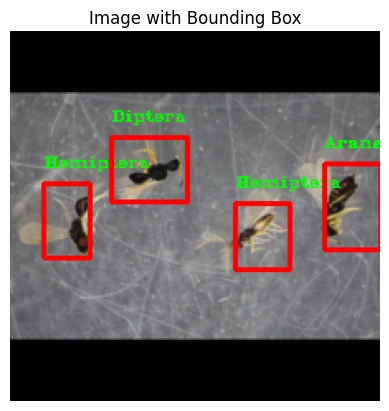

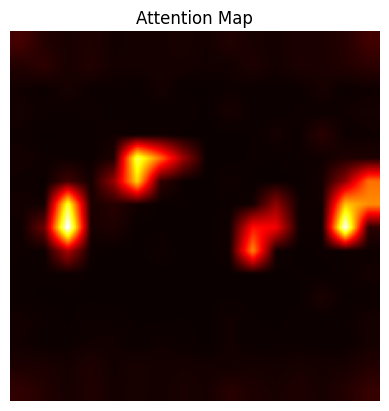

In [ ]:
rand_index = np.random.randint(0, images_tensor.shape[0])
image = images_tensor[91, :]
print(f"Current Image Index: {rand_index}")
extract_attention_maps(image, layer_index=5, threshold=0.2, merge_threshold=5, plot=True)

The names in green are the classification results. We also show the attention map to demonstrate where the model focuses on. The highlighted areas resemble the areas where the bugs are, proving the effectiveness of the model.

## **9.5. Results and Discussion**

The names in **green** represent the classification results from EfficientNet-B0.  
We also display the **attention map** to illustrate where the DINOv2 model focuses its attention.  
The **bright areas** in the attention heatmap closely align with the actual locations of the insects,  
demonstrating that the model is effectively identifying salient regions.


Since our dataset does not include ground-truth bounding boxes, we evaluate DINOv2's object detection **qualitatively**.  
By visually inspecting the results, we observe that DINOv2 reliably highlights insect regions in most cases.

Given that our **EfficientNet-B0 classifier** achieves a high test accuracy of **99.2%**,  
we reasonably assume that **correctly cropped regions lead to accurate classification**.  
This validates the effectiveness of our detection-classification pipeline, even in the absence of labeled data.


# **10. Conclusion and Discussion**

Our project successfully demonstrates the potential of machine learning, particularly deep learning models, in automating bug classification from visual data. Among the three models tested, EfficientNet emerged as the best performer, achieving the highest accuracy and generalization, as evidenced by both the training and test results. This model's performance was stable across epochs, and it effectively handled class imbalances due to the applied data augmentation techniques.

However, the object detection component still requires further refinement. Although the integration of object detection with the best classifier showed promising results, there is room for improvement, especially in detecting bugs within images that may be partially obscured or in complex backgrounds. This could involve fine-tuning the object detection model to increase its accuracy in detecting and bounding bugs more reliably.

From a workflow perspective, the collaboration on a shared notebook can be improved, particularly regarding naming conventions and consistency, to enhance the project's organizational efficiency.

# **11. Future Work**

- **Object Detection**: Fine-tuning the object detection model is crucial for improving its ability to detect bugs in more varied and challenging environments.
- **Dataset Expansion**: Expanding the dataset with more diverse images beyond the controlled lab environment will allow the model to generalize better to real-world scenarios.
- **Model Evaluation**: Further testing and evaluation of the integrated model on new datasets can provide insights into its scalability and adaptability to different biological studies.

Overall, this project lays a solid foundation for automating bug classification and detection, but the model can be enhanced with more training data and more sophisticated object detection techniques for practical applications in field research.

In [ ]:
import json

# Load the notebook JSON
with open('FinalReport.ipynb', 'r') as f:
    notebook = json.load(f)

# Clear widget state from metadata
if 'metadata' in notebook:
    notebook['metadata'].pop('widgets', None)

# Save the modified notebook
with open('FinalReport.ipynb', 'w') as f:
    json.dump(notebook, f)


In [ ]:
%%shell
jupyter nbconvert --to html FinalReport.ipynb

[NbConvertApp] Converting notebook FinalReport.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 15 image(s).
[NbConvertApp] Writing 10864613 bytes to FinalReport.html
